#### Preparation before dta processing

In [222]:
import csv
import geopandas
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
from descartes import PolygonPatch
plt.rcParams['figure.figsize']=[20,15]

In [223]:
df= pd.read_csv('melb_data.csv')

In [224]:
pd.set_option('display.max_columns', None)

#### Getting to know data

In [225]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [226]:
df.tail()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,26/08/2017,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,NaN,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,26/08/2017,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,NaN,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,26/08/2017,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,NaN,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,26/08/2017,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,NaN,-37.85908,144.89299,Western Metropolitan,6380.0
13579,Yarraville,6 Agnes St,4,h,1285000.0,SP,Village,26/08/2017,6.3,3013.0,4.0,1.0,1.0,362.0,112.0,1920.0,NaN,-37.81188,144.88449,Western Metropolitan,6543.0


In [227]:
df.describe(include = "all")

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
count,13580,13580,13580.000000,13580,1.358000e+04,13580,13580,13580,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,12211,13580.000000,13580.000000,13580,13580.000000
unique,314,13378,NaN,3,NaN,5,268,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33,NaN,NaN,8,NaN
top,Reservoir,14 Arthur St,NaN,h,NaN,S,Nelson,27/05/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Moreland,NaN,NaN,Southern Metropolitan,NaN
freq,359,3,NaN,9449,NaN,9022,1565,473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1163,NaN,NaN,4695,NaN
mean,NaN,NaN,2.937997,NaN,1.075684e+06,NaN,NaN,NaN,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,NaN,-37.809203,144.995216,NaN,7454.417378
std,NaN,NaN,0.955748,NaN,6.393107e+05,NaN,NaN,NaN,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,NaN,0.079260,0.103916,NaN,4378.581772
min,NaN,NaN,1.000000,NaN,8.500000e+04,NaN,NaN,NaN,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,NaN,-38.182550,144.431810,NaN,249.000000
25%,NaN,NaN,2.000000,NaN,6.500000e+05,NaN,NaN,NaN,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,NaN,-37.856822,144.929600,NaN,4380.000000
50%,NaN,NaN,3.000000,NaN,9.030000e+05,NaN,NaN,NaN,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,NaN,-37.802355,145.000100,NaN,6555.000000
75%,NaN,NaN,3.000000,NaN,1.330000e+06,NaN,NaN,NaN,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,NaN,-37.756400,145.058305,NaN,10331.000000


In [228]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

In [229]:
df.isnull().sum(axis=0)

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

#### Data preparation before analysing

In [230]:
df['Date']=pd.to_datetime(df['Date'],format='%d/%m/%Y',errors='coerce')

##### Since a property will at least can park their car offstreet, we will fill in N/A in Car column with 1

In [231]:
df['Car']=df['Car'].fillna('1')

##### For easy number reading, property price will be shown in $Million

In [232]:
df['Price']=(df['Price']/1000000).round(2)
df.rename(columns = {'Price':'Price in M'}, inplace = True)

#### since postcode,number of bedroom/bathroom, number of carpark and landsize are all integer number, the data type of these column will change to integer

In [233]:
df[['Postcode','Bedroom2','Bathroom','Car','Landsize']]=df[['Postcode','Bedroom2','Bathroom','Car','Landsize']].astype(int)

In [234]:
df.head()

,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1.48,S,Biggin,2016-12-03,2.5,3067,2,1,1,202,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1.03,S,Biggin,2016-02-04,2.5,3067,2,1,0,156,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1.46,SP,Biggin,2017-03-04,2.5,3067,3,2,0,134,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,0.85,PI,Biggin,2017-03-04,2.5,3067,3,2,1,94,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1.60,VB,Nelson,2016-06-04,2.5,3067,3,1,2,120,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [235]:
df.isnull().sum(axis=0)

Suburb              0
Address             0
Rooms               0
Type                0
Price in M          0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                 0
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

#### Since Building Area,YearBuilt and CouncilArea,Lattitude,Longtitude and Property count do not have close relationship with property price,so these columns will be dropped

In [236]:
df.drop(['BuildingArea','YearBuilt','CouncilArea','Lattitude','Longtitude','Propertycount'],axis=1,inplace=True)

In [237]:
df.head()

,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Regionname
0,Abbotsford,85 Turner St,2,h,1.48,S,Biggin,2016-12-03,2.5,3067,2,1,1,202,Northern Metropolitan
1,Abbotsford,25 Bloomburg St,2,h,1.03,S,Biggin,2016-02-04,2.5,3067,2,1,0,156,Northern Metropolitan
2,Abbotsford,5 Charles St,3,h,1.46,SP,Biggin,2017-03-04,2.5,3067,3,2,0,134,Northern Metropolitan
3,Abbotsford,40 Federation La,3,h,0.85,PI,Biggin,2017-03-04,2.5,3067,3,2,1,94,Northern Metropolitan
4,Abbotsford,55a Park St,4,h,1.60,VB,Nelson,2016-06-04,2.5,3067,3,1,2,120,Northern Metropolitan


#### Since the region classification for South-eastern and Southern suburb is not easy to understand, we will then combine these two suburbs before proceed our study.

In [238]:
df['Regionname']= df['Regionname'].replace(['South-Eastern Metropolitan'],['Southern Metropolitan'])
df

,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Regionname
0,Abbotsford,85 Turner St,2,h,1.48,S,Biggin,2016-12-03,2.5,3067,2,1,1,202,Northern Metropolitan
1,Abbotsford,25 Bloomburg St,2,h,1.03,S,Biggin,2016-02-04,2.5,3067,2,1,0,156,Northern Metropolitan
2,Abbotsford,5 Charles St,3,h,1.46,SP,Biggin,2017-03-04,2.5,3067,3,2,0,134,Northern Metropolitan
3,Abbotsford,40 Federation La,3,h,0.85,PI,Biggin,2017-03-04,2.5,3067,3,2,1,94,Northern Metropolitan
4,Abbotsford,55a Park St,4,h,1.60,VB,Nelson,2016-06-04,2.5,3067,3,1,2,120,Northern Metropolitan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1.25,S,Barry,2017-08-26,16.7,3150,4,2,2,652,Southern Metropolitan
13576,Williamstown,77 Merrett Dr,3,h,1.03,SP,Williams,2017-08-26,6.8,3016,3,2,2,333,Western Metropolitan
13577,Williamstown,83 Power St,3,h,1.17,S,Raine,2017-08-26,6.8,3016,3,2,4,436,Western Metropolitan
13578,Williamstown,96 Verdon St,4,h,2.50,PI,Sweeney,2017-08-26,6.8,3016,4,1,5,866,Western Metropolitan


### Perspectives of analysis:
Assuming we are doing analysing for a property investor, so we want to help to find if there's a way to find valuable investing property.This will be done by doing the following:
    
    1.look at how property price move as time goes.
    2.look at the quantity/median price sold to decide one property type to be focused on (property type that sold the most) 
    3.depends on which property type selected from above. try to find out if factors such as region/suburb/landsize/number of rooms have any relationship with price of the selected property price
    4.why particular suburbs can sell higher price as compare to other suburbs? is it related to the distance to city?

#### 1.How is property price moves over time by each type.

In [241]:
df_H=df[df['Type'].str.contains('h')]
df_H

,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Regionname
0,Abbotsford,85 Turner St,2,h,1.48,S,Biggin,2016-12-03,2.5,3067,2,1,1,202,Northern Metropolitan
1,Abbotsford,25 Bloomburg St,2,h,1.03,S,Biggin,2016-02-04,2.5,3067,2,1,0,156,Northern Metropolitan
2,Abbotsford,5 Charles St,3,h,1.46,SP,Biggin,2017-03-04,2.5,3067,3,2,0,134,Northern Metropolitan
3,Abbotsford,40 Federation La,3,h,0.85,PI,Biggin,2017-03-04,2.5,3067,3,2,1,94,Northern Metropolitan
4,Abbotsford,55a Park St,4,h,1.60,VB,Nelson,2016-06-04,2.5,3067,3,1,2,120,Northern Metropolitan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1.25,S,Barry,2017-08-26,16.7,3150,4,2,2,652,Southern Metropolitan
13576,Williamstown,77 Merrett Dr,3,h,1.03,SP,Williams,2017-08-26,6.8,3016,3,2,2,333,Western Metropolitan
13577,Williamstown,83 Power St,3,h,1.17,S,Raine,2017-08-26,6.8,3016,3,2,4,436,Western Metropolitan
13578,Williamstown,96 Verdon St,4,h,2.50,PI,Sweeney,2017-08-26,6.8,3016,4,1,5,866,Western Metropolitan


In [380]:
df_H1=df_H.groupby(["Date"])["Price in M"].median().reset_index()

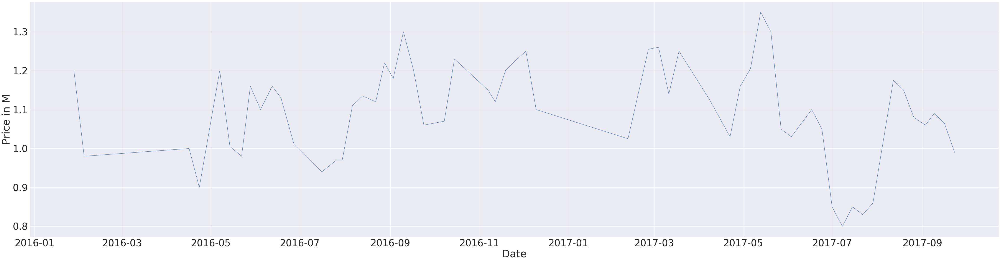

In [381]:
sns.set(rc={"figure.figsize":(80, 20)}) 
sns.set(font_scale=4)
sns.lineplot(x='Date', y='Price in M',data=df_H1)

In [382]:
df_U=df[df['Type'].str.contains('u')]
df_U

,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Regionname
8,Abbotsford,6/241 Nicholson St,1,u,0.30,S,Biggin,2016-10-08,2.5,3067,1,1,1,0,Northern Metropolitan
10,Abbotsford,411/8 Grosvenor St,2,u,0.70,VB,Jellis,2016-11-12,2.5,3067,2,2,1,0,Northern Metropolitan
12,Abbotsford,123/56 Nicholson St,2,u,0.75,S,Biggin,2016-11-12,2.5,3067,2,2,1,0,Northern Metropolitan
14,Abbotsford,7/20 Abbotsford St,1,u,0.44,SP,Greg,2016-05-14,2.5,3067,1,1,1,0,Northern Metropolitan
22,Abbotsford,138/56 Nicholson St,3,u,1.09,S,Jellis,2017-03-18,2.5,3067,3,2,2,4290,Northern Metropolitan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13482,Malvern East,2002 Malvern Rd,2,u,0.65,SP,Jellis,2017-08-26,8.4,3145,2,1,1,129,Southern Metropolitan
13492,Mitcham,2/61 Orient Av,3,u,0.91,S,Noel,2017-08-26,17.2,3132,3,2,2,309,Eastern Metropolitan
13495,Moonee Ponds,1/53 Buckley St,2,u,0.44,S,Nelson,2017-08-26,6.2,3039,2,1,1,1475,Western Metropolitan
13510,Nunawading,3/39 Lemon Gr,2,u,0.71,S,Jellis,2017-08-26,15.4,3131,2,1,1,903,Eastern Metropolitan


In [383]:
df_U1=df_U.groupby(["Date"])["Price in M"].median().reset_index()

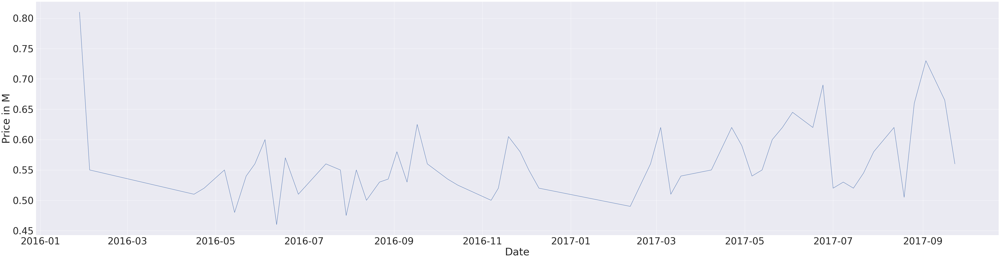

In [389]:
sns.set(rc={"figure.figsize":(80, 20)}) 
sns.set(font_scale=4)
sns.lineplot(x='Date', y='Price in M',data=df_U1)

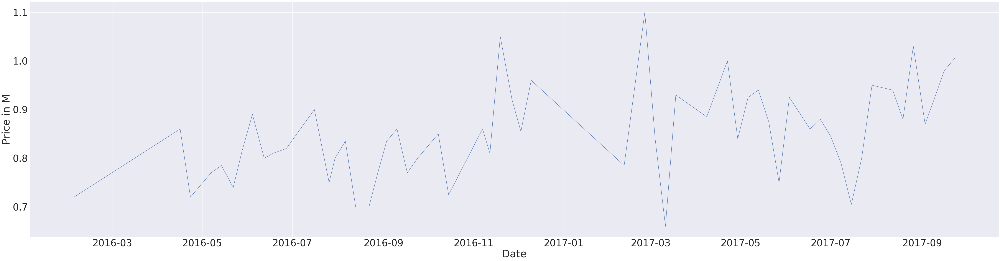

In [385]:
df_T=df[df['Type'].str.contains('t')]
df_T1=df_T.groupby(["Date"])["Price in M"].median().reset_index()
sns.set(rc={"figure.figsize":(80, 20)}) 
sns.set(font_scale=4)
sns.lineplot(x='Date', y='Price in M',data=df_T1)

### 2. quantity sold and median price sold in each type of properties

In [359]:
df_type=df.groupby('Type').size().reset_index(name="no. of property sold")
df_type=df_type.sort_values(by='no. of property sold',ascending=False)
df_type

,Type,no. of property sold
0,h,9449
2,u,3017
1,t,1114


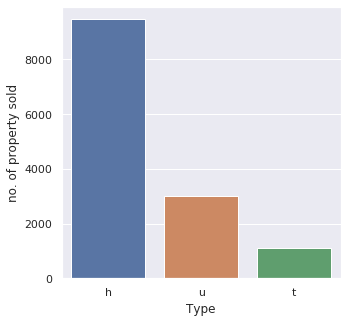

In [363]:
sns.set(rc={"figure.figsize":(5, 5)}) 
sns.barplot(data = df_type,x = 'Type',y = 'no. of property sold')

In [401]:
df_info=df.groupby(["Type"])["Price in M"].median().reset_index()
df_info

,Type,Price in M
0,h,1.08
1,t,0.85
2,u,0.56


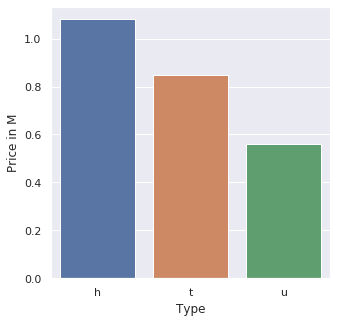

In [402]:
sns.set(rc={"figure.figsize":(5, 5)}) 
sns.barplot(data = df_info,x = 'Type',y = 'Price in M')

##### House sold at high median price with higher quantity sold, this could be better property type to invest among three

#### 3.Factors will affect house price?

##### How many houses are sold in each region?

In [239]:
df_region_number = df.groupby(['Regionname','Type']).size().reset_index(name="Count")
df_region_number=df_region_number.sort_values(by='Count', ascending=False)
df_region_number

,Regionname,Type,Count
9,Southern Metropolitan,h,3109
5,Northern Metropolitan,h,2754
12,Western Metropolitan,h,2290
11,Southern Metropolitan,u,1586
0,Eastern Metropolitan,h,1173
7,Northern Metropolitan,u,829
10,Southern Metropolitan,t,450
14,Western Metropolitan,u,419
6,Northern Metropolitan,t,307
13,Western Metropolitan,t,239


(array([0, 1, 2, 3, 4, 5, 6]), <a list of 7 Text xticklabel objects>)

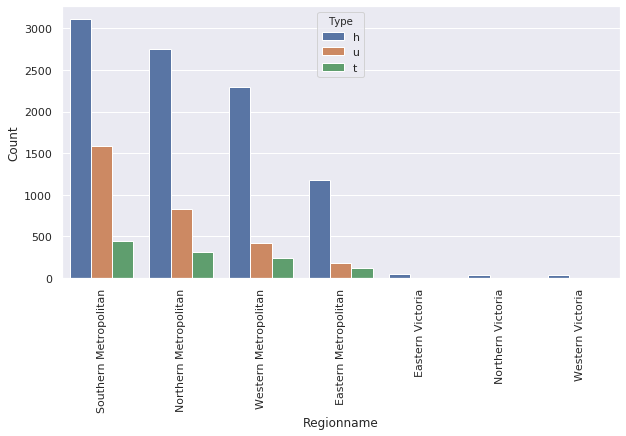

In [240]:
sns.set(rc={"figure.figsize":(10, 5)}) 
sns.barplot(data = df_region_number,x = 'Regionname',y = 'Count',hue='Type')
plt.xticks(rotation = 90)

##### what is the median price in each region?

In [408]:
df_region=df_H.groupby(["Regionname"])["Price in M"].median().reset_index()
df_region=df_region.sort_values(by='Price in M', ascending=False)
df_region

,Regionname,Price in M
4,Southern Metropolitan,1.54
0,Eastern Metropolitan,1.12
2,Northern Metropolitan,0.92
5,Western Metropolitan,0.87
1,Eastern Victoria,0.68
3,Northern Victoria,0.54
6,Western Victoria,0.40


(array([0, 1, 2, 3, 4, 5, 6]), <a list of 7 Text xticklabel objects>)

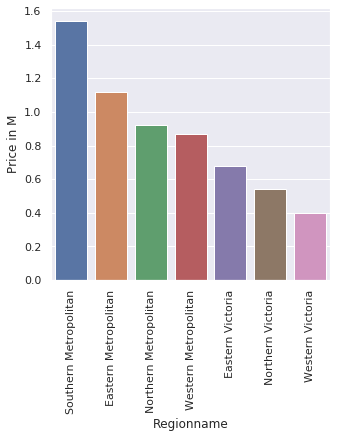

In [414]:
sns.set(rc={"figure.figsize":(5, 5)}) 
sns.barplot(data = df_region,x = 'Regionname',y = 'Price in M')
plt.xticks(rotation = 90)

### Southern Metropolitan has the biggest quantities/median sold among all regions. Study will be focused on Southern metropolitan area to see the possible relationship among price with other factors.

#### How each suburbs contribute to the total house sold in southern Metropolitan region?

In [415]:
df_S=df_H[df['Regionname'].str.contains('Southern Metropolitan')]
df_S

/home/alicia123/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Regionname
78,Albert Park,105 Kerferd Rd,2,h,1.27,S,hockingstuart,2016-09-03,3.3,3206,2,1,0,120,Southern Metropolitan
79,Albert Park,85 Richardson St,2,h,1.46,S,Thomson,2016-09-03,3.3,3206,2,1,0,159,Southern Metropolitan
80,Albert Park,112 Beaconsfield Pde,3,h,2.85,PI,Buxton,2017-03-04,3.3,3206,3,2,0,211,Southern Metropolitan
81,Albert Park,94 Graham St,3,h,1.85,S,Greg,2017-03-04,3.3,3206,3,2,0,128,Southern Metropolitan
82,Albert Park,396 Montague St,2,h,1.44,S,RT,2017-03-04,3.3,3206,2,1,0,130,Southern Metropolitan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13540,Seaford,137 East Rd,3,h,0.51,S,hockingstuart,2017-08-26,35.4,3198,3,1,1,576,Southern Metropolitan
13553,Surrey Hills,20 Albert Cr,4,h,2.72,S,Kay,2017-08-26,10.2,3127,4,3,2,1005,Southern Metropolitan
13554,Surrey Hills,46 Durham Rd,3,h,1.72,S,Noel,2017-08-26,10.2,3127,3,1,2,438,Southern Metropolitan
13555,Surrey Hills,3 Oak St,4,h,3.10,VB,Marshall,2017-08-26,10.2,3127,4,2,3,832,Southern Metropolitan


In [243]:
df_Suburb= df_S.groupby(['Suburb']).size().reset_index(name="Count")
df_Suburb=df_Suburb.sort_values(by='Count', ascending=False)
df_Suburb.head()

,Suburb,Count
11,Bentleigh East,168
8,Balwyn North,146
48,Glen Iris,137
58,Kew,115
14,Brighton,111


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]),
 <a list of 98 Text xticklabel objects>)

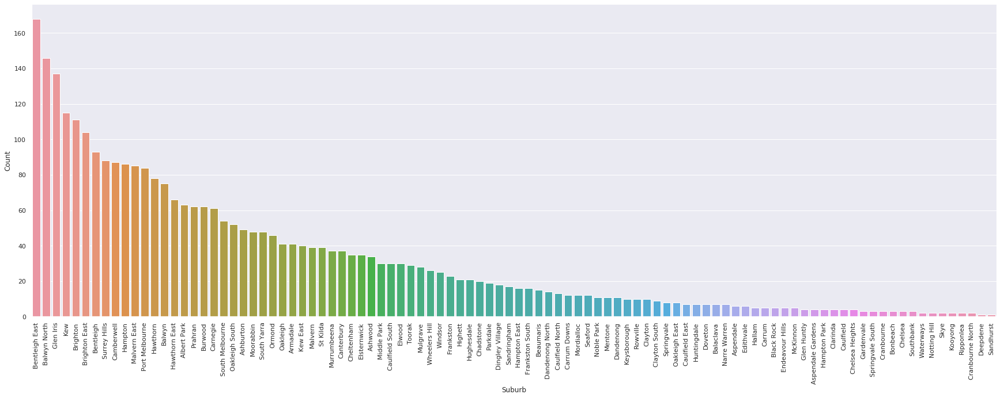

In [244]:
sns.set(rc={"figure.figsize":(30, 10)}) 
sns.barplot(data = df_Suburb,x = 'Suburb',y = 'Count')
plt.xticks(rotation = 90)

In [426]:
df_Suburb_M= df_S.groupby(["Suburb"])["Price in M"].median().reset_index()
df_Suburb_M=df_Suburb_M.sort_values(by='Price in M', ascending=False)
df_Suburb_M

,Suburb,Price in M
94,Toorak,2.620
18,Canterbury,2.510
14,Brighton,2.320
62,Malvern,2.300
7,Balwyn,2.200
...,...,...
52,Hampton Park,0.590
34,Cranbourne North,0.585
33,Cranbourne,0.570
21,Carrum Downs,0.550


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]),
 <a list of 98 Text xticklabel objects>)

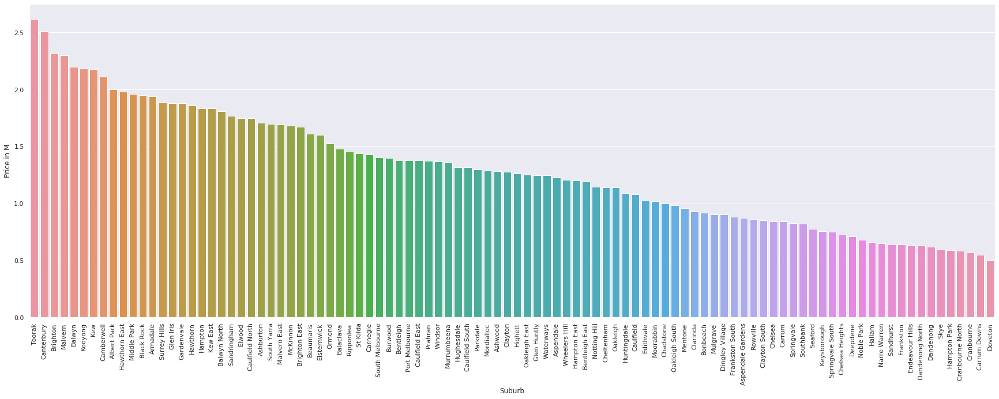

In [427]:
sns.set(rc={"figure.figsize":(30, 10)}) 
sns.barplot(data = df_Suburb_M,x = 'Suburb',y = 'Price in M')
plt.xticks(rotation = 90)

#### Bentleigh East, Balwyn North, Glen Iris and Kew has the biggest number of houses sold. we will be next looking at their price information.

In [416]:
df_BBGK=df_S.loc[df_S['Suburb'].isin(['Bentleigh East','Balwyn North','Glen Iris','Kew'])]
df_BBGK.head()

,Suburb,Address,Rooms,Type,Price in M,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Regionname
586,Balwyn North,153 Doncaster Rd,3,h,1.50,PI,Jellis,2016-09-03,9.2,3104,3,2,1,778,Southern Metropolitan
587,Balwyn North,19 Jacka St,4,h,3.23,S,Jellis,2016-09-03,9.2,3104,4,4,3,1135,Southern Metropolitan
588,Balwyn North,32 Jaserfold St,2,h,1.08,S,Jellis,2016-09-03,9.2,3104,2,1,1,253,Southern Metropolitan
589,Balwyn North,30 Abbott St,7,h,1.35,PI,Barry,2016-12-03,9.2,3104,7,2,0,942,Southern Metropolitan
590,Balwyn North,25 Bolinda Rd,4,h,1.90,S,Noel,2016-12-03,9.2,3104,4,2,2,647,Southern Metropolitan


#### What is the median price sold in each suburb?

In [421]:
df_BBGK_M=df_BBGK.groupby(["Suburb"])["Price in M"].median().reset_index()
df_BBGK_M=df_BBGK_M.sort_values(by='Price in M', ascending=False)
df_BBGK_M

,Suburb,Price in M
3,Kew,2.18
2,Glen Iris,1.88
0,Balwyn North,1.81
1,Bentleigh East,1.19


(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

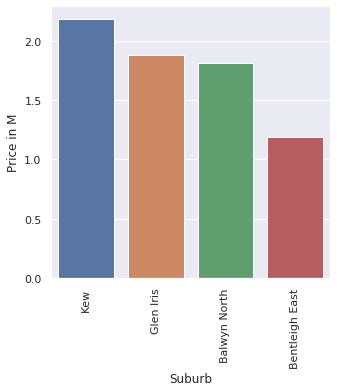

In [422]:
sns.set(rc={"figure.figsize":(5, 5)}) 
sns.barplot(data = df_BBGK_M,x = 'Suburb',y = 'Price in M')
plt.xticks(rotation = 90)

### Is there any relationship between landsize and house price in these suburbs?

#### I'll break the landsize data into four ranges. 1-300, 300-500,500-800 and 800 over.

In [423]:
df_BBGK1=df_BBGK[(df_BBGK['Landsize'] > 50) & (df_BBGK['Landsize'] < 300)]
df_BBGK2=df_BBGK[(df_BBGK['Landsize'] > 300) & (df_BBGK['Landsize'] < 500)]
df_BBGK3=df_BBGK[(df_BBGK['Landsize'] > 500) & (df_BBGK['Landsize'] < 800)]
df_BBGK4=df_BBGK[(df_BBGK['Landsize'] > 800) & (df_BBGK['Landsize'] < 1400)]

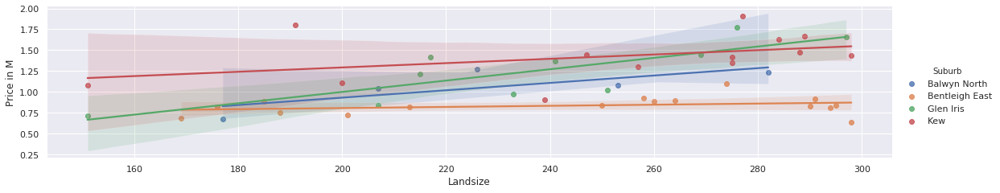

In [425]:
sns.set(rc={"figure.figsize":(65, 8)})
sns.lmplot(x = "Landsize", y = "Price in M", data = df_BBGK1,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

##### In above 0- 300 range,it's interesting to see in Glen Iris,Kew and Bawlyn North that landsize and house price has a positive relationship. Landsize doesn't seem to affect house price in Bentleigh east.

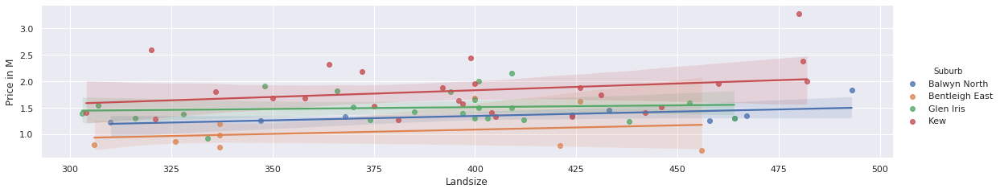

In [249]:
sns.set(rc={"figure.figsize":(65, 8)})
sns.lmplot(x = "Landsize", y = "Price in M", data = df_BBGK2,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

##### In above 300-500 range, all of the suburbs seem to have a not very clear positive relationship between landsize and house price

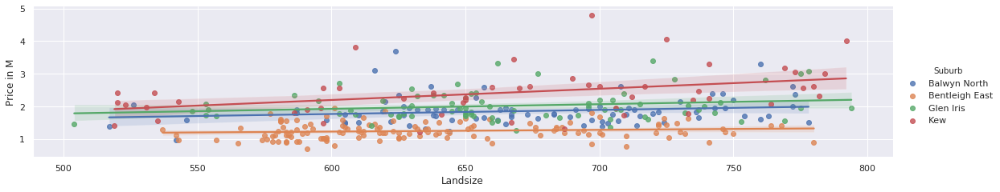

In [250]:
sns.set(rc={"figure.figsize":(65, 8)})
sns.lmplot(x = "Landsize", y = "Price in M", data = df_BBGK3,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

##### In above 500-800 range, only in Kew that Landsize will have positive relationship with house price. It's not very clear for the other 3 suburbs.

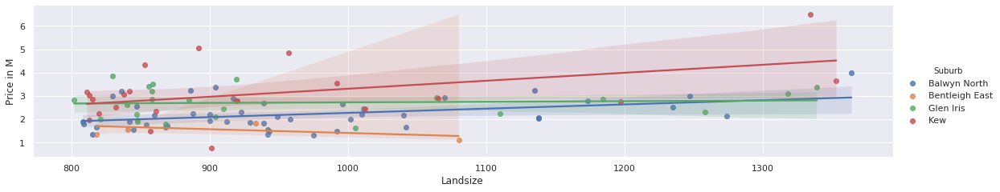

In [251]:
sns.set(rc={"figure.figsize":(65, 8)})
sns.lmplot(x = "Landsize", y = "Price in M", data = df_BBGK4,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

##### in above 800 to 1400 range, landsize have positive relationship in Kew and Bawlyn North, but not clear in Glen Iris and  seem to have negative relationship to house price in Gentleigh east.

#### Price seems to have linear relationship with Landsize in Kew in all landsize ranges and maybe Balwyn North as well. Landsize doesn't seem to have any affect in Bentleigh east.Let's take closer look on these four suburbs, if number of rooms will affect the house price?

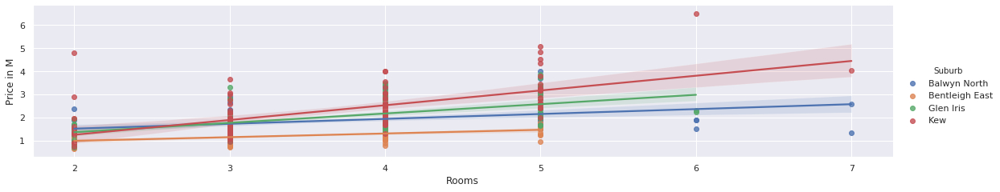

In [252]:
sns.set(rc={"figure.figsize":(65, 8)})
sns.lmplot(x = "Rooms", y = "Price in M", data = df_BBGK,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

#### It looks a linear relationship between number of rooms and house price in Bawlyn North, Glen Iris and especially Kew. It's not very clear for Bentleigh East.

#### It's suggested for a bigger landsize and more rooms in above 4 suburbs for a potential high return in house investment.

### Why houses can be sold higher in particular suburb then others?

#### what is the median price in all southern suburb?

In [253]:
df_S1=df_S.groupby(["Suburb"])["Price in M"].median().reset_index()
#df_S1=df_S.groupby('Suburb').median('Price in M').reset_index()
df_S1=df_S1.sort_values(by='Price in M', ascending=False)
df_S1

,Suburb,Price in M
94,Toorak,2.620
18,Canterbury,2.510
14,Brighton,2.320
62,Malvern,2.300
7,Balwyn,2.200
...,...,...
52,Hampton Park,0.590
34,Cranbourne North,0.585
33,Cranbourne,0.570
21,Carrum Downs,0.550


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
        85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97]),
 <a list of 98 Text xticklabel objects>)

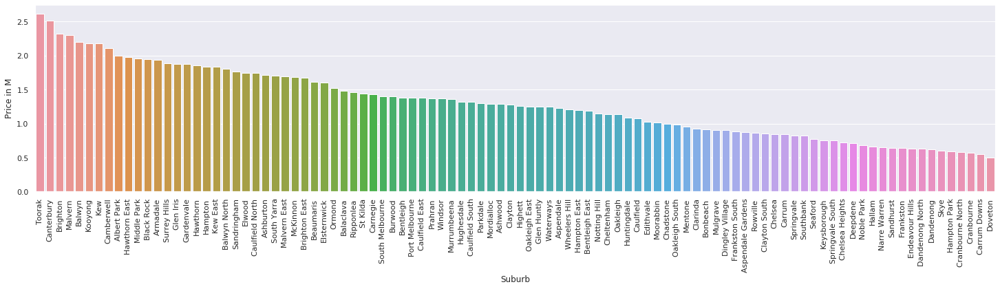

In [254]:
sns.set(rc={"figure.figsize":(25, 5)}) 
sns.barplot(data = df_S1,x='Suburb',y='Price in M')
plt.xticks(rotation = 90)

#### Is there any relationship between distance to city and House price? Set of 3 suburbs will be selected randomly from above list to make comparison

##### first set chosen as Canterbury, Brighton and Toorak from top ones

In [255]:
df_Select=df_S[['Suburb','Distance']]
df_Select

,Suburb,Distance
78,Albert Park,3.3
79,Albert Park,3.3
80,Albert Park,3.3
81,Albert Park,3.3
82,Albert Park,3.3
...,...,...
13540,Seaford,35.4
13553,Surrey Hills,10.2
13554,Surrey Hills,10.2
13555,Surrey Hills,10.2


In [256]:
df_joined=df_Select.merge(df_S1,on='Suburb',how="left")
df_joined

,Suburb,Distance,Price in M
0,Albert Park,3.3,2.000
1,Albert Park,3.3,2.000
2,Albert Park,3.3,2.000
3,Albert Park,3.3,2.000
4,Albert Park,3.3,2.000
...,...,...,...
3104,Seaford,35.4,0.775
3105,Surrey Hills,10.2,1.885
3106,Surrey Hills,10.2,1.885
3107,Surrey Hills,10.2,1.885


In [257]:
df_joined.drop_duplicates()

,Suburb,Distance,Price in M
0,Albert Park,3.3,2.000
39,Armadale,6.3,1.940
65,Ashburton,11.0,1.710
96,Ashwood,12.2,1.285
119,Balaclava,6.6,1.480
...,...,...,...
2572,Notting Hill,16.7,1.145
2583,Waterways,21.5,1.245
2607,Deepdene,7.9,0.710
2622,Springvale South,22.2,0.750


In [258]:
df_TCB=df_joined.loc[df_joined['Suburb'].isin(['Canterbury','Brighton','Toorak'])]
df_TCB

,Suburb,Distance,Price in M
460,Brighton,11.2,2.32
461,Brighton,11.2,2.32
462,Brighton,11.2,2.32
463,Brighton,11.2,2.32
464,Brighton,11.2,2.32
...,...,...,...
2918,Canterbury,8.4,2.51
3039,Brighton,10.5,2.32
3040,Brighton,10.5,2.32
3041,Brighton,10.5,2.32


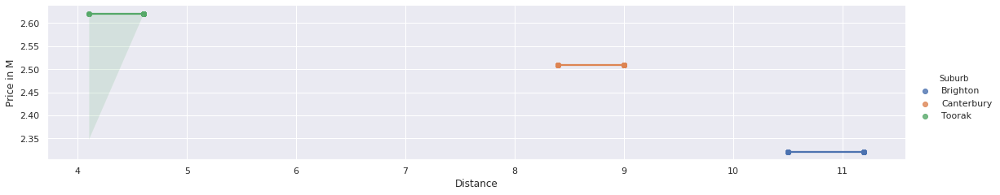

In [259]:
sns.set(rc={"figure.figsize":(35, 8)})
sns.lmplot(x = "Distance", y = "Price in M", data = df_TCB,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

##### Second set will be chosen from the last ones on the list,Noble Park, ENdeavour Hills and Cranbourne,let's see if Distance is  also affecting their house price.

In [260]:
df_DCC=df_joined.loc[df_joined['Suburb'].isin(['Noble Park','Endeavour Hills','Cranbourne'])]
df_DCC

,Suburb,Distance,Price in M
1991,Cranbourne,34.7,0.57
2178,Noble Park,22.7,0.68
2258,Noble Park,22.7,0.68
2371,Noble Park,22.7,0.68
2372,Noble Park,22.7,0.68
2373,Noble Park,22.7,0.68
2374,Noble Park,22.7,0.68
2426,Noble Park,22.7,0.68
2483,Cranbourne,34.7,0.57
2560,Endeavour Hills,28.5,0.63


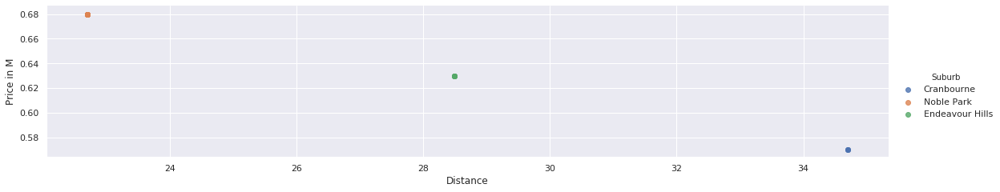

In [261]:
sns.set(rc={"figure.figsize":(35, 8)})
sns.lmplot(x = "Distance", y = "Price in M", data = df_DCC,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

##### Last set of data will be chosen from the middle ones of above median price ranking. Surrey Hills, Malvern and Hughesdale

In [262]:
df_SMH=df_joined.loc[df_joined['Suburb'].isin(['Surrey Hills','Malvern','Hughesdale'])]
df_SMH

,Suburb,Distance,Price in M
1042,Hughesdale,13.0,1.320
1043,Hughesdale,13.0,1.320
1044,Hughesdale,13.0,1.320
1045,Hughesdale,13.0,1.320
1046,Hughesdale,13.0,1.320
...,...,...,...
3020,Surrey Hills,10.2,1.885
3085,Malvern,5.9,2.300
3105,Surrey Hills,10.2,1.885
3106,Surrey Hills,10.2,1.885


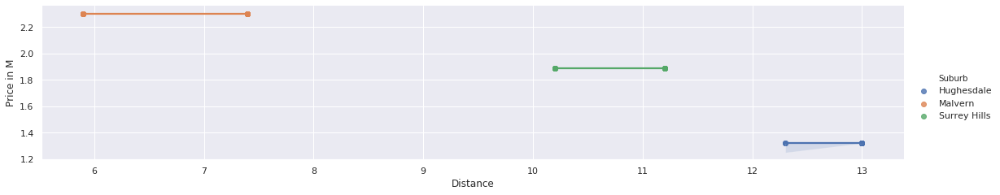

In [263]:
sns.set(rc={"figure.figsize":(35, 8)})
sns.lmplot(x = "Distance", y = "Price in M", data = df_SMH,hue="Suburb",height=3.5, aspect=4.5)
plt.show()

#### It's quite clear from above three graphs, there is linear relationship between house price and distance to City. So distance is part of the reason why some suburbs' house can sell higher price than others. There might be other reasons like distance to train station, distance to good schools etc., but these data are not available in this analysis and will be outside the scope of this analysis.

### Now, I'll look at how median price of each suburb looks like geographically

In [428]:
plt.rcParams['figure.figsize'] = [145, 125]
vic=geopandas.read_file("VICSUBURB.geojson")
vic

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,vic_loca_2,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry
0,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.1,6670,2011-08-31,None,VIC2615,2012-04-27,None,UNDERBOOL,None,None,G,None,2,"POLYGON ((141.74552 -35.07229, 141.74552 -35.0..."
1,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2,6671,2011-08-31,None,VIC1986,2012-04-27,None,NURRAN,None,None,G,None,2,"POLYGON ((148.66877 -37.39571, 148.66767 -37.3..."
2,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.3,6672,2011-08-31,None,VIC2862,2012-04-27,None,WOORNDOO,None,None,G,None,2,"POLYGON ((142.92288 -37.97886, 142.85448 -37.9..."
3,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.4,6673,2011-08-31,None,VIC734,2017-08-09,None,DEPTFORD,None,None,G,None,2,"POLYGON ((147.82336 -37.66001, 147.72499 -37.6..."
4,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.5,6674,2011-08-31,None,VIC2900,2012-04-27,None,YANAC,None,None,G,None,2,"POLYGON ((141.27978 -35.99859, 141.28480 -35.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2969,10667,2017-06-02,None,VIC1635,2017-08-09,None,MELBOURNE AIRPORT,None,None,G,None,2,"POLYGON ((144.86758 -37.67103, 144.86630 -37.6..."
2969,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2970,10666,2017-06-02,None,VIC381,2017-08-09,None,BULLA,None,None,G,None,2,"POLYGON ((144.80472 -37.66949, 144.80353 -37.6..."
2970,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2971,10688,2017-06-02,None,VIC2308,2017-08-09,None,SOMERS,None,None,G,None,2,"POLYGON ((145.19240 -38.40087, 145.18947 -38.4..."
2971,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2972,10687,2017-06-02,None,VIC1187,2017-08-09,None,HMAS CERBERUS,None,None,G,None,2,"POLYGON ((145.19240 -38.40087, 145.19624 -38.3..."


In [429]:
vic.columns = vic.columns.str.replace('vic_loca_2', 'Suburb')
vic

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,Suburb,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry
0,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.1,6670,2011-08-31,None,VIC2615,2012-04-27,None,UNDERBOOL,None,None,G,None,2,"POLYGON ((141.74552 -35.07229, 141.74552 -35.0..."
1,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2,6671,2011-08-31,None,VIC1986,2012-04-27,None,NURRAN,None,None,G,None,2,"POLYGON ((148.66877 -37.39571, 148.66767 -37.3..."
2,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.3,6672,2011-08-31,None,VIC2862,2012-04-27,None,WOORNDOO,None,None,G,None,2,"POLYGON ((142.92288 -37.97886, 142.85448 -37.9..."
3,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.4,6673,2011-08-31,None,VIC734,2017-08-09,None,DEPTFORD,None,None,G,None,2,"POLYGON ((147.82336 -37.66001, 147.72499 -37.6..."
4,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.5,6674,2011-08-31,None,VIC2900,2012-04-27,None,YANAC,None,None,G,None,2,"POLYGON ((141.27978 -35.99859, 141.28480 -35.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2969,10667,2017-06-02,None,VIC1635,2017-08-09,None,MELBOURNE AIRPORT,None,None,G,None,2,"POLYGON ((144.86758 -37.67103, 144.86630 -37.6..."
2969,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2970,10666,2017-06-02,None,VIC381,2017-08-09,None,BULLA,None,None,G,None,2,"POLYGON ((144.80472 -37.66949, 144.80353 -37.6..."
2970,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2971,10688,2017-06-02,None,VIC2308,2017-08-09,None,SOMERS,None,None,G,None,2,"POLYGON ((145.19240 -38.40087, 145.18947 -38.4..."
2971,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2972,10687,2017-06-02,None,VIC1187,2017-08-09,None,HMAS CERBERUS,None,None,G,None,2,"POLYGON ((145.19240 -38.40087, 145.19624 -38.3..."


In [430]:
vic1=vic.loc[vic['Suburb'].isin(['NOBLE PARK','ENDEAVOUR HILLS','CRANBOURNE'])]
vic1

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,Suburb,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry
836,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.802,7365,2011-08-31,None,VIC864,2012-04-27,None,ENDEAVOUR HILLS,None,None,G,None,2,"POLYGON ((145.23338 -37.96566, 145.23363 -37.9..."
1848,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.1822,9315,2011-08-31,None,VIC661,2012-04-27,None,CRANBOURNE,None,None,G,None,2,"POLYGON ((145.29125 -38.12915, 145.28618 -38.1..."
2820,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2802,10573,2017-02-27,None,VIC1948,2017-05-02,None,NOBLE PARK,None,None,G,None,2,"POLYGON ((145.15859 -37.98118, 145.15917 -37.9..."


In [431]:
df_S1['Suburb'] = df_S1['Suburb'].str.upper()
df_S1

,Suburb,Price in M
94,TOORAK,2.620
18,CANTERBURY,2.510
14,BRIGHTON,2.320
62,MALVERN,2.300
7,BALWYN,2.200
...,...,...
52,HAMPTON PARK,0.590
34,CRANBOURNE NORTH,0.585
33,CRANBOURNE,0.570
21,CARRUM DOWNS,0.550


In [432]:
vic_joined=vic.merge(df_S1,on='Suburb',how="left")

In [433]:
vic_joined.fillna(0, inplace=True)
vic_joined

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,Suburb,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry,Price in M
0,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.1,6670,2011-08-31,0,VIC2615,2012-04-27,0,UNDERBOOL,0,0,G,0,2,"POLYGON ((141.74552 -35.07229, 141.74552 -35.0...",0.0
1,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2,6671,2011-08-31,0,VIC1986,2012-04-27,0,NURRAN,0,0,G,0,2,"POLYGON ((148.66877 -37.39571, 148.66767 -37.3...",0.0
2,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.3,6672,2011-08-31,0,VIC2862,2012-04-27,0,WOORNDOO,0,0,G,0,2,"POLYGON ((142.92288 -37.97886, 142.85448 -37.9...",0.0
3,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.4,6673,2011-08-31,0,VIC734,2017-08-09,0,DEPTFORD,0,0,G,0,2,"POLYGON ((147.82336 -37.66001, 147.72499 -37.6...",0.0
4,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.5,6674,2011-08-31,0,VIC2900,2012-04-27,0,YANAC,0,0,G,0,2,"POLYGON ((141.27978 -35.99859, 141.28480 -35.9...",0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2969,10667,2017-06-02,0,VIC1635,2017-08-09,0,MELBOURNE AIRPORT,0,0,G,0,2,"POLYGON ((144.86758 -37.67103, 144.86630 -37.6...",0.0
2969,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2970,10666,2017-06-02,0,VIC381,2017-08-09,0,BULLA,0,0,G,0,2,"POLYGON ((144.80472 -37.66949, 144.80353 -37.6...",0.0
2970,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2971,10688,2017-06-02,0,VIC2308,2017-08-09,0,SOMERS,0,0,G,0,2,"POLYGON ((145.19240 -38.40087, 145.18947 -38.4...",0.0
2971,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2972,10687,2017-06-02,0,VIC1187,2017-08-09,0,HMAS CERBERUS,0,0,G,0,2,"POLYGON ((145.19240 -38.40087, 145.19624 -38.3...",0.0


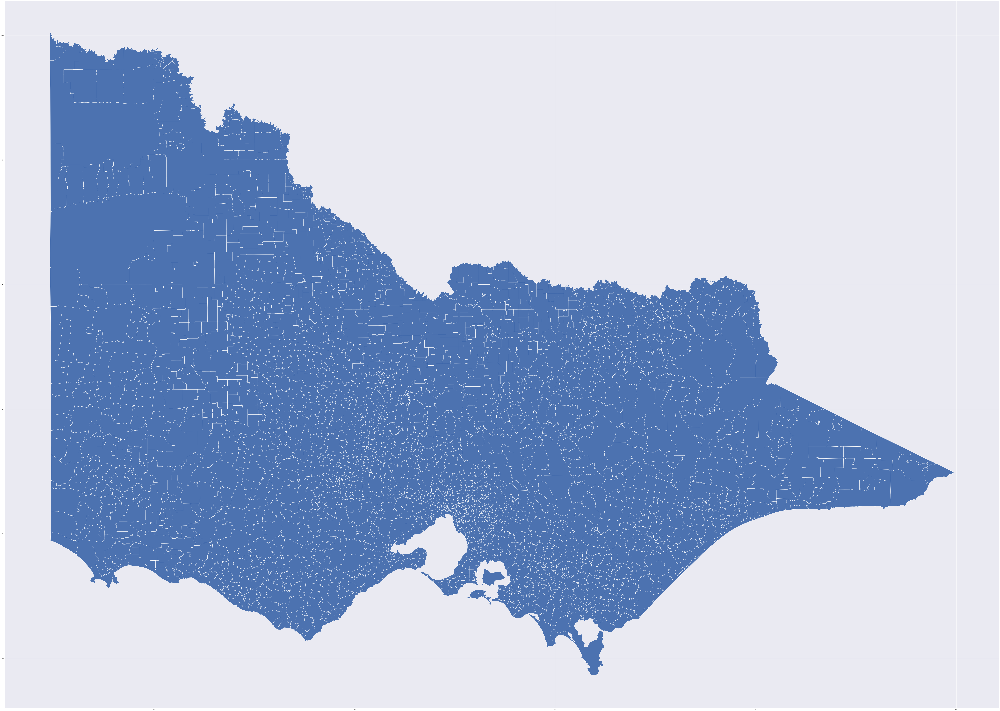

In [434]:
vic_joined.plot()

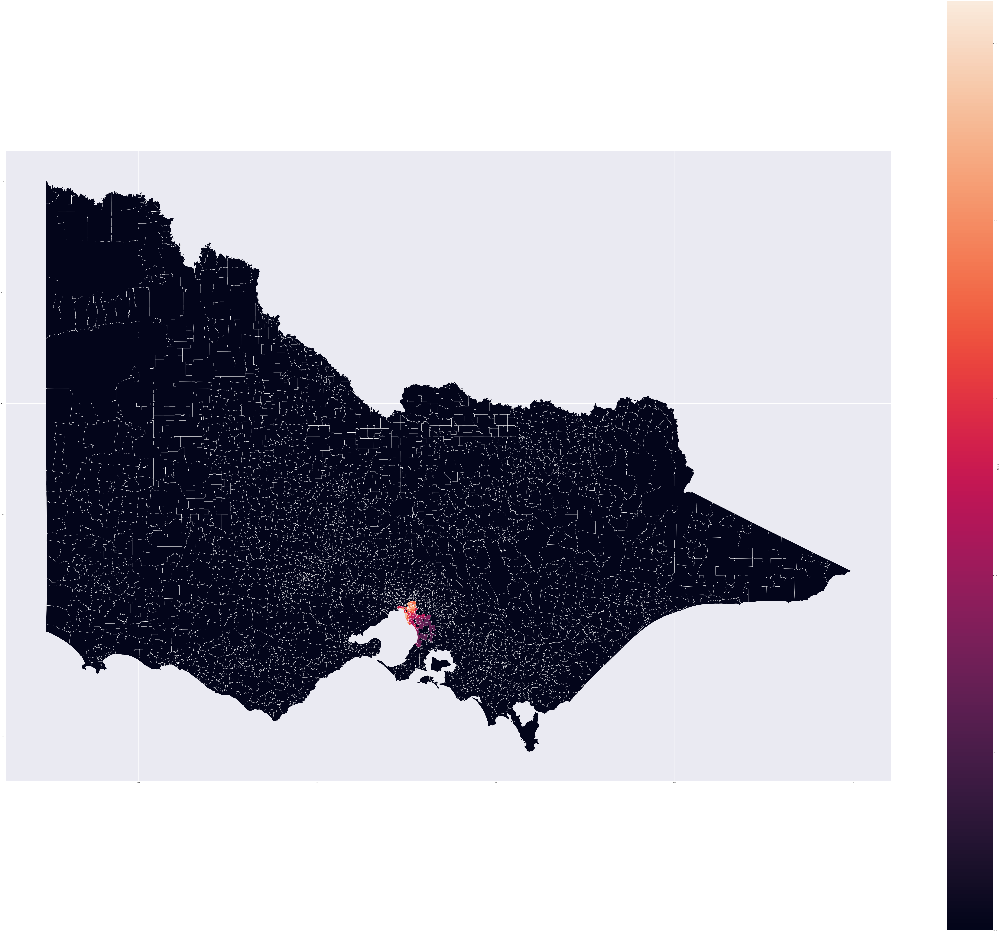

In [435]:
fig_leg, ax_leg = plt.subplots(1, 1)
vic_joined.plot(column='Price in M', ax=ax_leg, legend=True, legend_kwds={'label': "Price in M",'orientation': "vertical"})

#### It's the same conclusion we have got above that the closer the suburb is to city, the higher the house price will be

## As a suggestion to potential property investors, selection should be based on the following points:


   1.choose House to invest 
   2. closer to city
   3. bigger landsize
   4. more rooms 